In [2]:
%reload_ext autoreload
%autoreload 2

In [1]:
import pandas as pd
import numpy as np
#import swifter
import networkx as nx
from sklearn.cluster import SpectralClustering

import japanize_matplotlib
import matplotlib.pyplot as plt
#plt.rcParams['font.family'] = 'IPAPGothic' #全体のフォントを設定
%matplotlib inline

/usr/local/lib/python3.7/site-packages/japanize_matplotlib/japanize_matplotlib.py:15: MatplotlibDeprecationWarning: 
The createFontList function was deprecated in Matplotlib 3.2 and will be removed two minor releases later. Use FontManager.addfont instead.
  font_list = font_manager.createFontList(font_files)


In [3]:
import sys
sys.path.append('../')

import src.network_analytics as na

In [4]:
df_raw = pd.read_csv('../data/qiita_org.csv',)
df_raw.head()

,detail_page_url,logo_url,name,n_posts,n_goods,org_url,org_email,org_addr,org_description,org_content,n_member,member_url_list,tag_name,tag_icon,tag_post,tag_good
0,https://qiita.com/organizations/qiitadon,https://s3-ap-northeast-1.amazonaws.com/qiita-...,Qiitadonユーザー会,7558,24808,https://qiitadon.com/,NaN,NaN,Qiitadon（β）から生まれた Qiita ユーザー・コミュニティです。,About\nQiitadonユーザー会は Qiitan をこよなく愛する Qiitadon...,38,"['https://qiita.com/pxpxpxpx', 'https://qiita....",#migrated,https://s3-ap-northeast-1.amazonaws.com/qiita-...,3745,2486
1,https://qiita.com/organizations/qiitadon,https://s3-ap-northeast-1.amazonaws.com/qiita-...,Qiitadonユーザー会,7558,24808,https://qiitadon.com/,NaN,NaN,Qiitadon（β）から生まれた Qiita ユーザー・コミュニティです。,About\nQiitadonユーザー会は Qiitan をこよなく愛する Qiitadon...,38,"['https://qiita.com/pxpxpxpx', 'https://qiita....",cppBuilder,https://s3-ap-northeast-1.amazonaws.com/qiita-...,855,183
2,https://qiita.com/organizations/qiitadon,https://s3-ap-northeast-1.amazonaws.com/qiita-...,Qiitadonユーザー会,7558,24808,https://qiitadon.com/,NaN,NaN,Qiitadon（β）から生まれた Qiita ユーザー・コミュニティです。,About\nQiitadonユーザー会は Qiitan をこよなく愛する Qiitadon...,38,"['https://qiita.com/pxpxpxpx', 'https://qiita....",TechEnglish,https://s3-ap-northeast-1.amazonaws.com/qiita-...,788,114
3,https://qiita.com/organizations/qiitadon,https://s3-ap-northeast-1.amazonaws.com/qiita-...,Qiitadonユーザー会,7558,24808,https://qiitadon.com/,NaN,NaN,Qiitadon（β）から生まれた Qiita ユーザー・コミュニティです。,About\nQiitadonユーザー会は Qiitan をこよなく愛する Qiitadon...,38,"['https://qiita.com/pxpxpxpx', 'https://qiita....",borgWarp,https://s3-ap-northeast-1.amazonaws.com/qiita-...,471,284
4,https://qiita.com/organizations/qiitadon,https://s3-ap-northeast-1.amazonaws.com/qiita-...,Qiitadonユーザー会,7558,24808,https://qiitadon.com/,NaN,NaN,Qiitadon（β）から生まれた Qiita ユーザー・コミュニティです。,About\nQiitadonユーザー会は Qiitan をこよなく愛する Qiitadon...,38,"['https://qiita.com/pxpxpxpx', 'https://qiita....",link,https://s3-ap-northeast-1.amazonaws.com/qiita-...,375,134


In [5]:
df_raw.columns

Index(['detail_page_url', 'logo_url', 'name', 'n_posts', 'n_goods', 'org_url',
       'org_email', 'org_addr', 'org_description', 'org_content', 'n_member',
       'member_url_list', 'tag_name', 'tag_icon', 'tag_post', 'tag_good'],
      dtype='object')

In [7]:
cols = ['name', 'n_posts', 'n_goods', 'tag_name', 'tag_post', 'tag_good']

df_raw[cols]

df = df_raw[cols].copy()

In [65]:
g1, g2 = na.gen_bipartite_network_projection(df
                                             , n1_name='name', n2_name='tag_name'
                                            )

In [124]:
g = nx.Graph()

# node、edgeの追加
g.add_nodes_from(df['name'], bipartite=0)
g.add_nodes_from(df['tag_name'], bipartite=1)
g.add_edges_from([(row['name'], row['tag_name']) for idx, row in df.iterrows()])

top_nodes = {n for n, d in g.nodes(data=True) if d.get("bipartite") == 0}
bottom_nodes = set(g) - top_nodes

# 射像グラフ
g1_t = nx.algorithms.bipartite.weighted_projected_graph(g, top_nodes)
g2_b = nx.algorithms.bipartite.weighted_projected_graph(g, bottom_nodes)


In [125]:
len(list(top_nodes))

920

In [131]:
gt = g1_t.copy()
for n, d in g1_t.nodes(data=True):
    if d.get("bipartite") is None:
        gt.remove_node(n)

gb = g2_b.copy()
for n, d in g2_b.nodes(data=True):
    if d.get("bipartite") is None:
        gb.remove_node(n)

In [133]:
len(gb), len(gt)

(1085, 920)

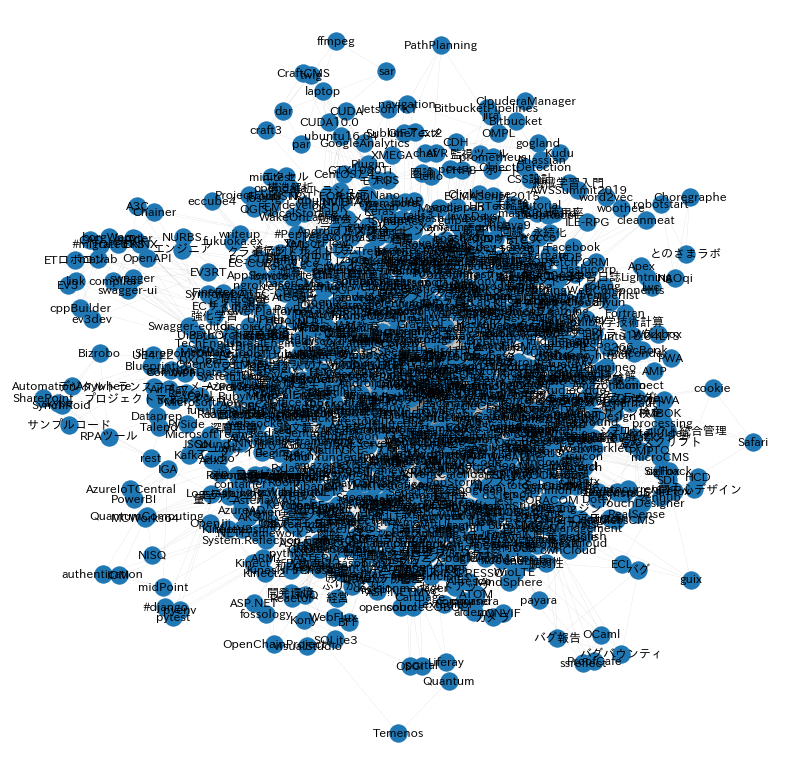

In [135]:
na.draw_network(gb, df, draw_label=True)


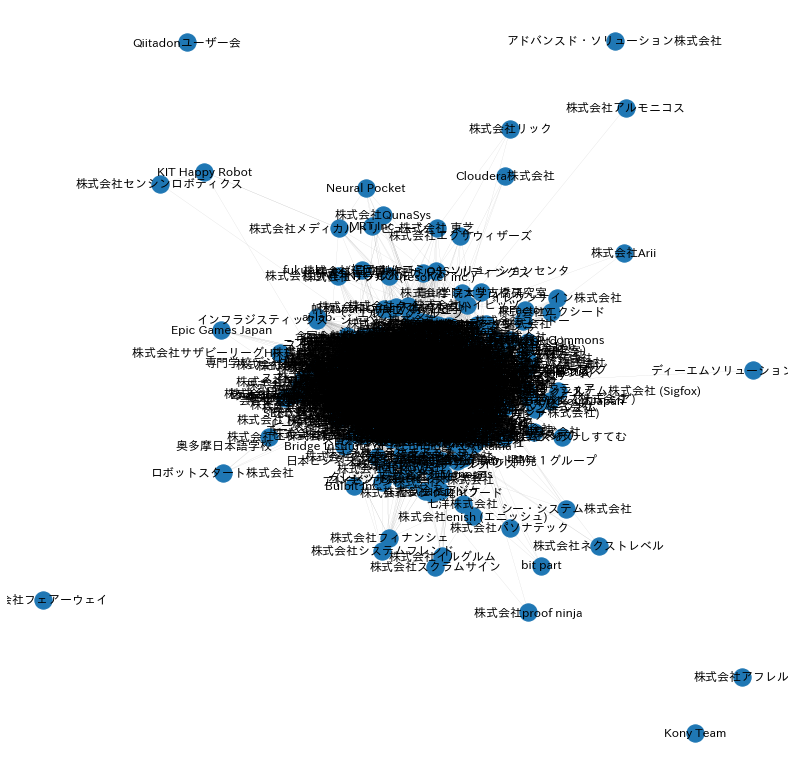

In [136]:
na.draw_network(gt, df, draw_label=True)


In [64]:
# https://netwulf.readthedocs.io/en/latest/

#### tag name graphを調査

In [199]:
na.network_stats(gb)

network stats
    ノード数: 1085
    リンク数: 5421
    1node当たりの平均リンク数: 4.996
    クラスタリング係数: 0.844
    次数相関: -0.229  
    


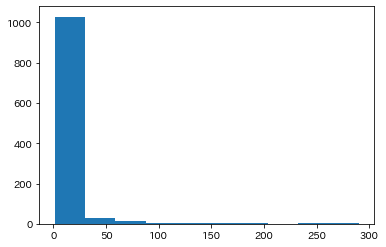

In [190]:
na.plot_degree_dist(gb)

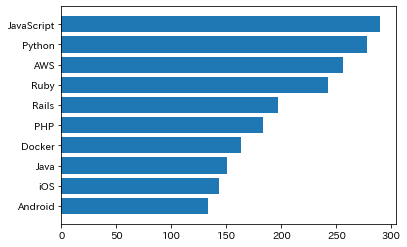

In [188]:
# 次数top 10
plt.barh(*zip(*sorted(dict(gb.degree()).items(), key=lambda x: x[1], reverse=True)[:10][::-1]))
plt.show()


In [205]:
df_com = na.get_girvan_newman_com(gb)

num of community: 8


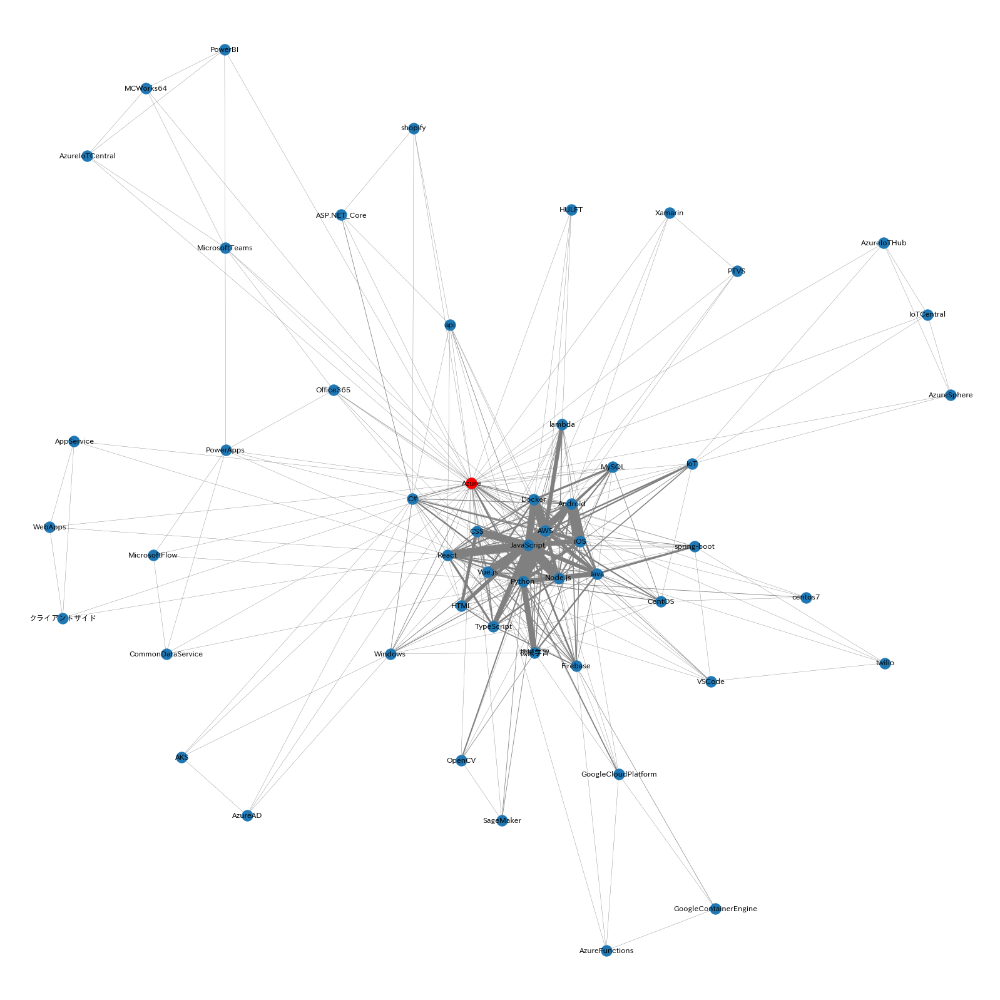

In [239]:
na.draw_ego_network(gb, df,
                    node_name='Azure', draw_label=True)

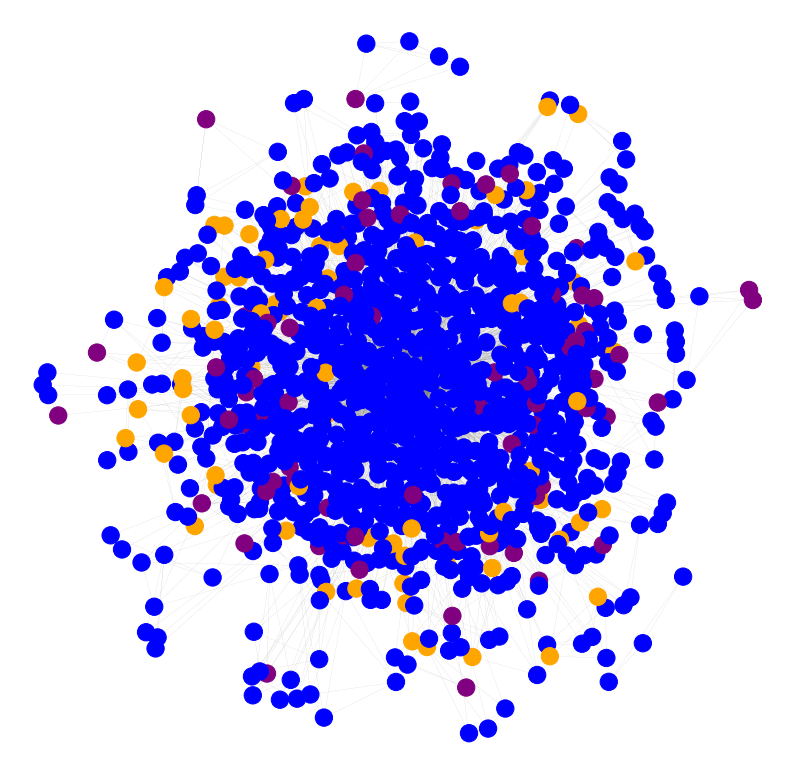

In [279]:
sc = na.SpectralClustering(k=3)
sc.fit(gb)
sc_cmap = {
    0: 'orange',
    1: 'blue',
    2: 'purple',
    3: 'green',
    4: 'gray'
}
node_color = [sc_cmap[l] for l in sc.predict()]

na.draw_network(gb, df, node_color=node_color,
                draw_label=False)



In [278]:
# 一緒に出やすさ
df_weight = pd.DataFrame(sorted(gb.edges(data=True), key=lambda t: t[2].get('weight'), reverse=True)[:15])

pd.concat([df_weight, pd.json_normalize(df_weight[2])], axis=1).drop(2, axis=1)


,0,1,weight
0,Ruby,Rails,134
1,iOS,Swift,68
2,JavaScript,PHP,62
3,Python,JavaScript,47
4,JavaScript,AWS,47
5,Laravel,PHP,46
6,JavaScript,Ruby,45
7,iOS,Android,44
8,JavaScript,Rails,43
9,JavaScript,Node.js,40


In [280]:
# n2v
import src.node2vec as n2v
import concurrent.futures
import os

In [281]:
probs = n2v.init_probs(gb, directed=False)
G = n2v.Graph(gb, probs, p=0.5, q=0.5
              , walks_par_node=10, walk_len=80)

In [282]:
from time import time
start = time()
with concurrent.futures.ThreadPoolExecutor(max_workers=os.cpu_count()) as executor:
    executor.map(G.compute_probabilities_conc, list(G.graph.nodes()))  
end = time()
print("Completed in {:.2f} minutes.".format((end - start)/60))

Completed in 0.05 minutes.


In [283]:
from itertools import chain
from time import time
start = time()
with concurrent.futures.ThreadPoolExecutor(max_workers=os.cpu_count()) as executor:
    #for node in G.graph.nodes():
        #walks_map = executor.submit(G.generate_random_walks_conc, node)
    walks_map = executor.map(G.generate_node_walks_conc, list(G.graph.nodes()))

walks = list(chain.from_iterable(list(walks_map)))
end = time()
print("Completed in {:.2f} minutes.".format((end - start)/60))

Completed in 1.37 minutes.


In [284]:
model = n2v.generate_embeddings(walks, dimensions=128, window=5, workers=1
                                , p=0.5, q=0.5, output_file='./n2v_tag.model')


Saved model to :  ./n2v_tag.model
Time elapsed for Generating embeddings ----> 0:00:19.479786

---------------------------------------



In [285]:
tokens = [model[word] for word in model.wv.vocab]
labels = [word for word in model.wv.vocab]

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


In [286]:
import umap

emb = umap.UMAP().fit_transform(tokens)


/usr/local/lib/python3.7/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


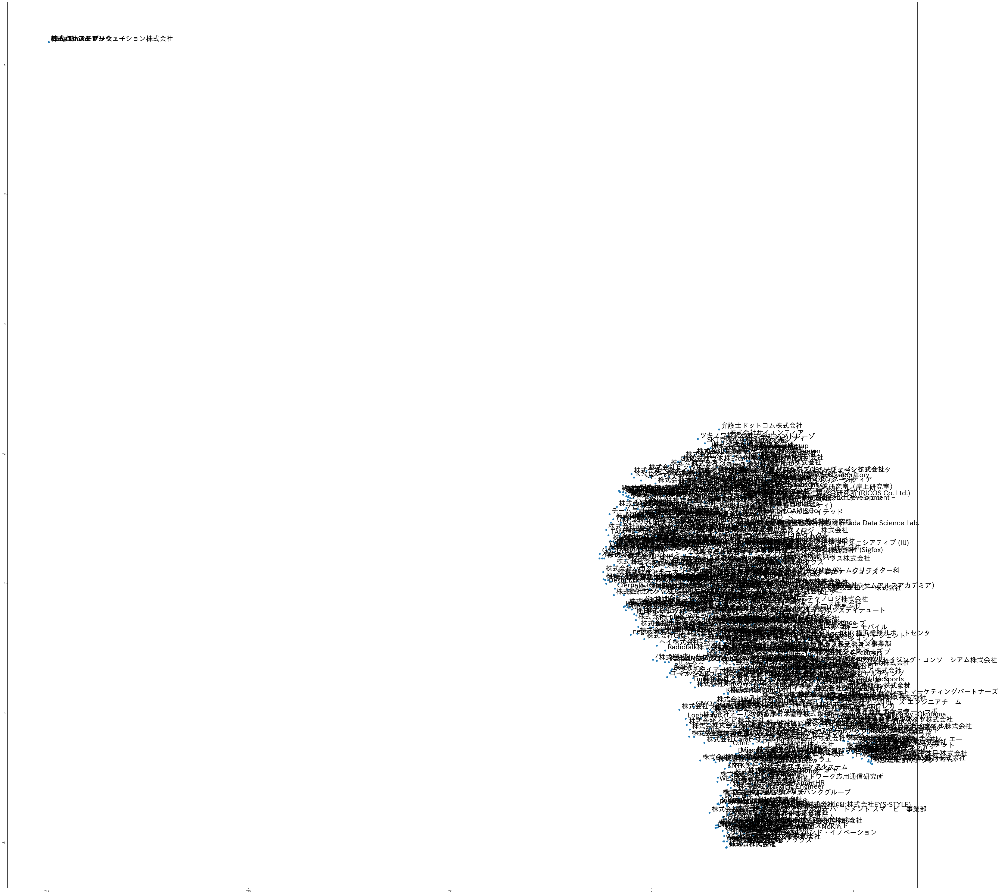

In [400]:
plt.figure(figsize=(60, 60))
n_plot = 1085
plt.scatter(emb[:n_plot, 0], emb[:n_plot, 1])

# TODO get label
for label, x, y in zip(labels[:n_plot], emb[:n_plot, 0], emb[:n_plot, 1]):

    plt.annotate(label, xy=(x, y), size=25
                 , xytext=(8, 4), textcoords='offset points')
    
plt.show()

In [302]:
# clustering
from sklearn.cluster import KMeans
n_clusters = 10
kmeans_model = KMeans(n_clusters=n_clusters, verbose=0, random_state=42, n_jobs=-1)

tokens = [model[word] for word in model.wv.vocab]
kmeans_model.fit(tokens)


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/usr/local/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:974: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


KMeans(n_clusters=10, n_jobs=-1, random_state=42)

#### org name graphを調査

In [303]:
na.network_stats(gt)

network stats
    ノード数: 920
    リンク数: 126558
    1node当たりの平均リンク数: 137.563
    クラスタリング係数: 0.697
    次数相関: 0.071  
    


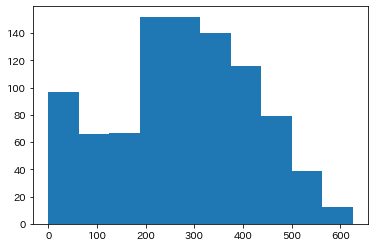

In [304]:
na.plot_degree_dist(gt)

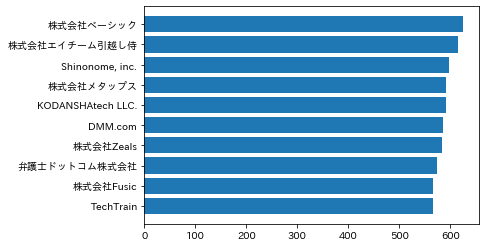

In [305]:
# 次数top 10
plt.barh(*zip(*sorted(dict(gt.degree()).items(), key=lambda x: x[1], reverse=True)[:10][::-1]))
plt.show()


In [306]:
df_com = na.get_girvan_newman_com(gt)

num of community: 8


In [401]:
df[df['name'] == '株式会社ベーシック']

,name,n_posts,n_goods,tag_name,tag_post,tag_good
4339,株式会社ベーシック,17,209,JavaScript,4,96
4340,株式会社ベーシック,17,209,TypeScript,4,96
4341,株式会社ベーシック,17,209,Microsoft,3,15
4342,株式会社ベーシック,17,209,C#,3,7
4343,株式会社ベーシック,17,209,bot,3,10
4344,株式会社ベーシック,17,209,Rails,105,6702
4345,株式会社ベーシック,17,209,Ruby,88,5463
4346,株式会社ベーシック,17,209,JavaScript,64,5733
4347,株式会社ベーシック,17,209,PHP,31,1609
4348,株式会社ベーシック,17,209,AWS,28,2644


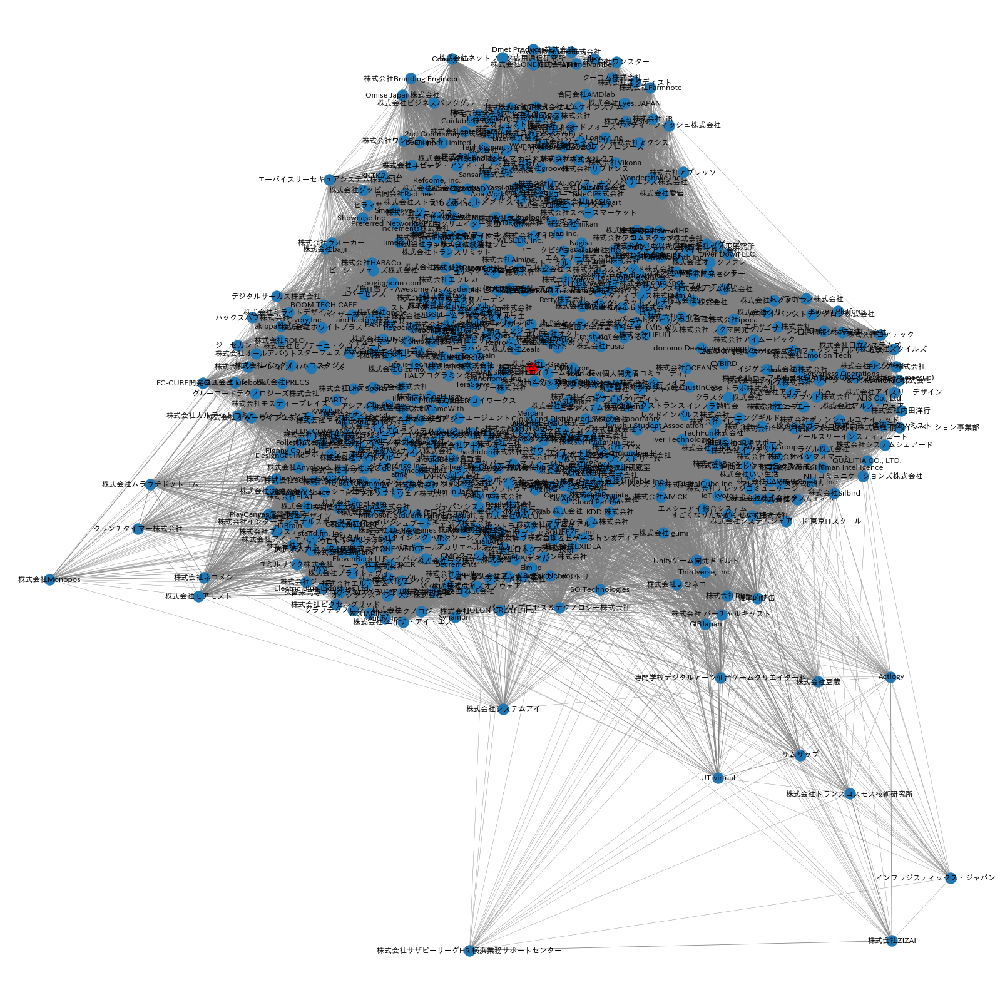

In [307]:
na.draw_ego_network(gt, df,
                    node_name='株式会社ベーシック', draw_label=True)

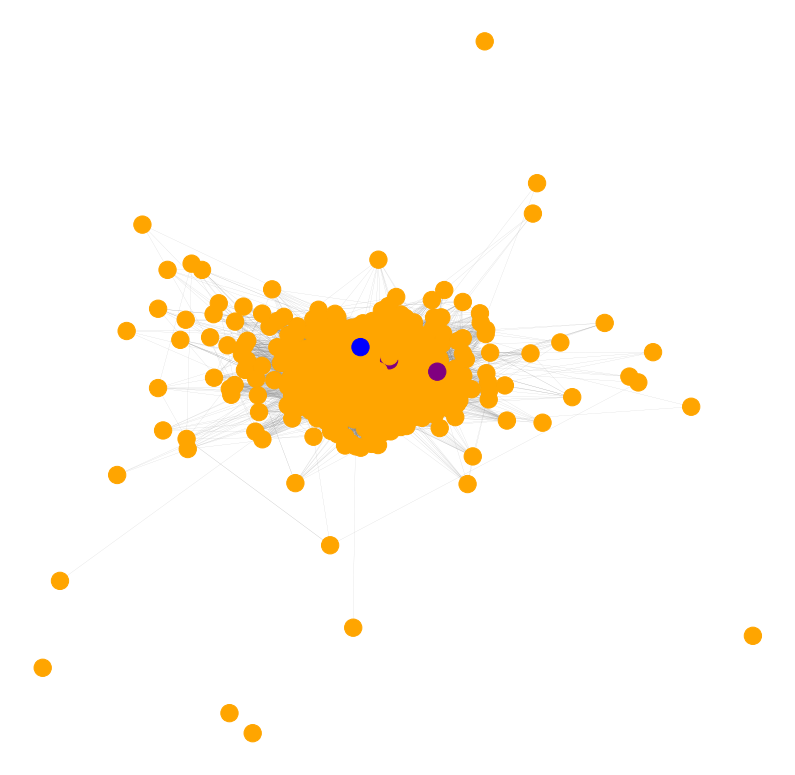

In [308]:
sc = na.SpectralClustering(k=3)
sc.fit(gt)
sc_cmap = {
    0: 'orange',
    1: 'blue',
    2: 'purple',
    3: 'green',
    4: 'gray'
}
node_color = [sc_cmap[l] for l in sc.predict()]

na.draw_network(gt, df, node_color=node_color,
                draw_label=False)



In [366]:
# 一緒に出やすさ
df_weight = pd.DataFrame(sorted(gt.edges(data=True), key=lambda t: t[2].get('weight'), reverse=True)[:15])

pd.concat([df_weight, pd.json_normalize(df_weight[2])], axis=1).drop(2, axis=1)


,0,1,weight
0,ベルフェイス株式会社,（故）シナプス株式会社,5
1,株式会社ラグザイア,mofmof inc.,5
2,株式会社 Zaim,株式会社ナナイロ,5
3,株式会社 Zaim,エンジニアと人生サロン,5
4,株式会社 Zaim,株式会社スピカ,5
5,株式会社LITALICO,株式会社ジモティー,5
6,株式会社ヒューマンクレスト,"Japan Quality Co.,Ltd",5
7,株式会社よむネコ,"Thirdverse, Inc.",5
8,株式会社アンドパッド,株式会社オクト,5
9,ストアーズ・ドット・ジェーピー株式会社,ヘイ株式会社,5


In [374]:
# n2v
import src.node2vec as n2v
import concurrent.futures
import os

In [375]:
probs = n2v.init_probs(gt, directed=False)
G = n2v.Graph(gt, probs, p=0.5, q=0.5
              , walks_par_node=10, walk_len=40)

In [376]:
from time import time
start = time()
with concurrent.futures.ThreadPoolExecutor(max_workers=os.cpu_count()) as executor:
    executor.map(G.compute_probabilities_conc, list(G.graph.nodes()))  
end = time()
print("Completed in {:.2f} minutes.".format((end - start)/60))

Completed in 17.73 minutes.


In [377]:
from itertools import chain
from time import time
start = time()
with concurrent.futures.ThreadPoolExecutor(max_workers=os.cpu_count()) as executor:
    #for node in G.graph.nodes():
        #walks_map = executor.submit(G.generate_random_walks_conc, node)
    walks_map = executor.map(G.generate_node_walks_conc, list(G.graph.nodes()))

walks = list(chain.from_iterable(list(walks_map)))
end = time()
print("Completed in {:.2f} minutes.".format((end - start)/60))

Completed in 1.04 minutes.


In [390]:
model = n2v.generate_embeddings(walks, dimensions=64, window=5, workers=1
                                ,p=0.5, q=0.5, output_file='./n2v_org.model')


Saved model to :  ./n2v_org.model
Time elapsed for Generating embeddings ----> 0:00:13.400551

---------------------------------------



In [391]:
tokens = [model[word] for word in model.wv.vocab]
labels = [word for word in model.wv.vocab]

/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:1: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  """Entry point for launching an IPython kernel.


In [392]:
import umap

emb = umap.UMAP().fit_transform(tokens)


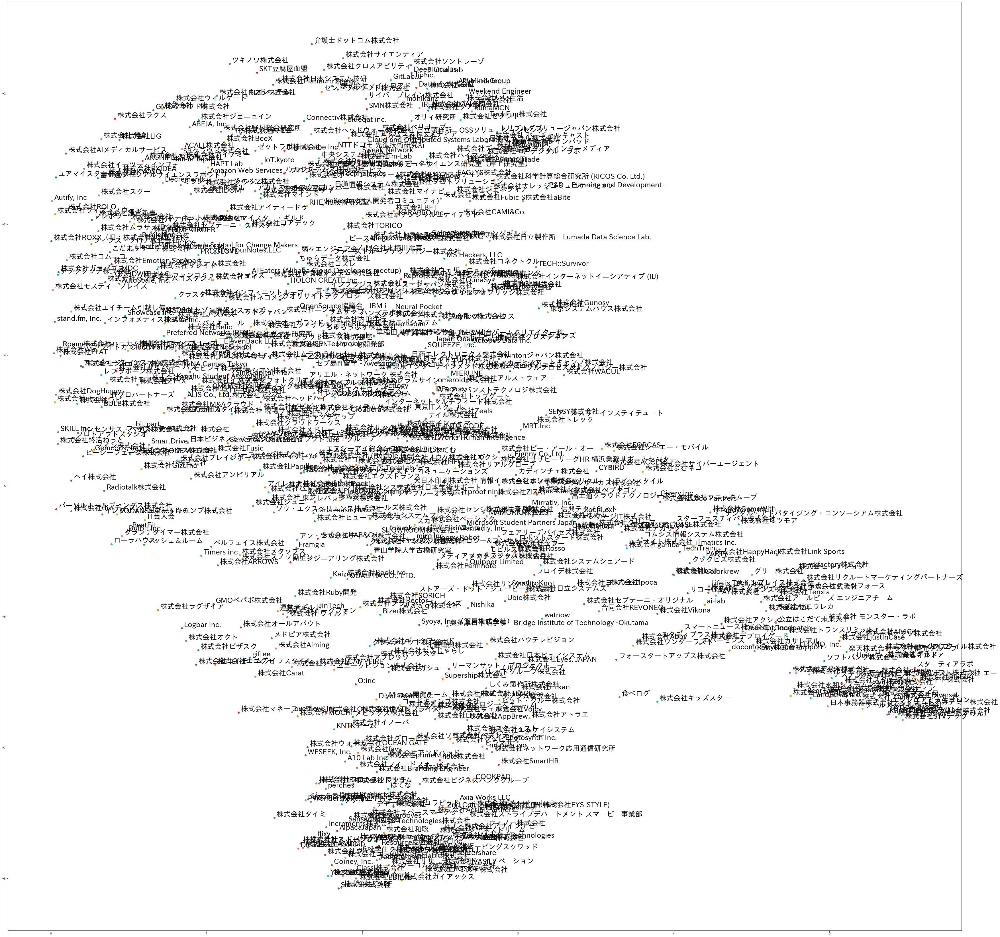

In [398]:
plt.figure(figsize=(60, 60))
n_plot = 920
# まとめて描画
#plt.scatter(emb[:n_plot, 0], emb[:n_plot, 1])

# TODO get label
for label, x, y in zip(labels[:n_plot], emb[:n_plot, 0], emb[:n_plot, 1]):
    if x < 0:
        #print('x,y', x, y, label)
        continue
    plt.scatter(x, y)
    plt.annotate(label, xy=(x, y), size=25
                 , xytext=(8, 4), textcoords='offset points')
    
plt.show()

In [394]:
#除外
"""
x,y -5.6925483 3.025262 Kony Team
x,y -5.6925473 3.0252616 Qiitadonユーザー会
x,y -5.6925406 3.0252626 アドバンスド・ソリューション株式会社
x,y -5.6925383 3.0252619 株式会社フェアーウェイ
x,y -5.692534 3.025262 株式会社アフレル
"""

'\nx,y -5.6925483 3.025262 Kony Team\nx,y -5.6925473 3.0252616 Qiitadonユーザー会\nx,y -5.6925406 3.0252626 アドバンスド・ソリューション株式会社\nx,y -5.6925383 3.0252619 株式会社フェアーウェイ\nx,y -5.692534 3.025262 株式会社アフレル\n'

In [395]:
items = []

def get_sim_topn_df(model, labels, topn=10):
    sims = []
    for l in labels:
        res = model.wv.most_similar(
           positive=[l],
           topn=topn
        )
        #for vocab, sim in res:
        #    print(labels[vocab])
        sims += [[l, vocab, sim] for vocab, sim in res]
    #return sims
    df = pd.DataFrame(sims, columns=['target', 'org_name', 'sim'])
    return df

df_n2v_pred = get_sim_topn_df(model, labels)

In [396]:
df_n2v_pred[df_n2v_pred['target']=='Unityゲーム開発者ギルド']


,target,org_name,sim
6690,Unityゲーム開発者ギルド,株式会社アスクリード,0.959476
6691,Unityゲーム開発者ギルド,キャロルシステム仙台株式会社,0.958449
6692,Unityゲーム開発者ギルド,アル株式会社,0.957546
6693,Unityゲーム開発者ギルド,楽天株式会社,0.957131
6694,Unityゲーム開発者ギルド,株式会社AIVICK,0.956966
6695,Unityゲーム開発者ギルド,株式会社グラファー,0.956226
6696,Unityゲーム開発者ギルド,ウェルスタイル株式会社,0.955408
6697,Unityゲーム開発者ギルド,日本事務器株式会社,0.954871
6698,Unityゲーム開発者ギルド,ai-lab,0.954664
6699,Unityゲーム開発者ギルド,"iRidge, Inc.",0.953882


In [397]:
df_n2v_pred[df_n2v_pred['target']=='株式会社ディー・エヌ・エー']


,target,org_name,sim
2470,株式会社ディー・エヌ・エー,スポットメイト株式会社,0.968872
2471,株式会社ディー・エヌ・エー,株式会社Diverse,0.957001
2472,株式会社ディー・エヌ・エー,スターティアラボ,0.955518
2473,株式会社ディー・エヌ・エー,TDCソフト株式会社,0.954575
2474,株式会社ディー・エヌ・エー,株式会社Blabo,0.954174
2475,株式会社ディー・エヌ・エー,ニフティライフスタイル株式会社,0.952878
2476,株式会社ディー・エヌ・エー,株式会社アーカイブ,0.952637
2477,株式会社ディー・エヌ・エー,エンジニアと人生サロン,0.952550
2478,株式会社ディー・エヌ・エー,株式会社ラフール,0.950842
2479,株式会社ディー・エヌ・エー,株式会社 モンスター・ラボ,0.946454


In [317]:
# clustering
from sklearn.cluster import KMeans
n_clusters = 10
kmeans_model = KMeans(n_clusters=n_clusters, verbose=0, random_state=42, n_jobs=-1)

tokens = [model[word] for word in model.wv.vocab]
kmeans_model.fit(tokens)


/usr/local/lib/python3.7/site-packages/ipykernel_launcher.py:6: DeprecationWarning: Call to deprecated `__getitem__` (Method will be removed in 4.0.0, use self.wv.__getitem__() instead).
  
/usr/local/lib/python3.7/site-packages/sklearn/cluster/_kmeans.py:974: FutureWarning: 'n_jobs' was deprecated in version 0.23 and will be removed in 0.25.
  " removed in 0.25.", FutureWarning)


KMeans(n_clusters=10, n_jobs=-1, random_state=42)